In [1]:
import pandas as pd
import pandas_profiling

pd.read_csv('ventas.csv', header =0).profile_report()


In [12]:
import pandas as pd
import pandas_profiling
import numpy as np 
import seaborn as sns
import matplotlib.pyplot as plt
from mlxtend.frequent_patterns import apriori
from mlxtend.frequent_patterns import association_rules
import mlxtend as ml

ds = pd.read_csv('ventas.csv', header =0)

ds = ds.drop(["NetPrice", "FamilyName", "LocationId", "CountryId", "SeriesMasterId", "SourceId", "BuyerId", ds.columns[13], ds.columns[14], ds.columns[15], ds.columns[16], ds.columns[17], ds.columns[18], ds.columns[19]], axis=1)

print(ds.shape)

(339975, 6)


Original Size CustomerTypeId 1:  (80315, 6)
Original Size CustomerTypeId 2:  (99462, 6)
Original Size CustomerTypeId 3:  (65921, 6)
Tipo de usuario: 1


(array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9]), <a list of 10 Text xticklabel objects>)

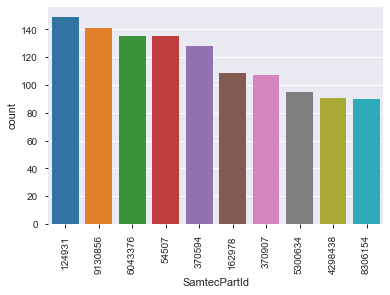

In [20]:
#Primero agrupamos resultados por tipos de customerType
#1	90316
#2	134706
#3	108016
#5	2764
#8	4173

dfCT1 = ds[(ds['CustomerTypeId'] == 1) & (ds['CustomerId'] != 2135) & (ds['CustomerId'] != 48449) & (ds['CustomerId'] != 24826) & (ds['CustomerId'] != 1543)]
print("Original Size CustomerTypeId 1: ", str(dfCT1.shape))

dfCT2 = ds[(ds['CustomerTypeId'] == 2) & (ds['CustomerId'] != 2560) & (ds['CustomerId'] != 2881) & (ds['CustomerId'] != 11159)]
print("Original Size CustomerTypeId 2: ", str(dfCT2.shape))

dfCT3 = ds[(ds['CustomerTypeId'] == 3) & (ds['CustomerId'] != 1072) & (ds['CustomerId'] != 1028) & (ds['CustomerId'] != 2155) & (ds['CustomerId'] != 1377) & (ds['CustomerId'] != 1045)]
print("Original Size CustomerTypeId 3: ", str(dfCT3.shape))

# 11% de los datos tienen NaN en FamilyName:
# Missing values can be treated as a separate category by itself. 
# We can create another category for the missing values and use them as a different level. This is the simplest method.


print("Tipo de usuario: 1")
sns.countplot(x = 'SamtecPartId', data = dfCT1, order = dfCT1['SamtecPartId'].value_counts().iloc[:10].index)
plt.xticks(rotation=90)

Tipo de usuario: 2


(array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9]), <a list of 10 Text xticklabel objects>)

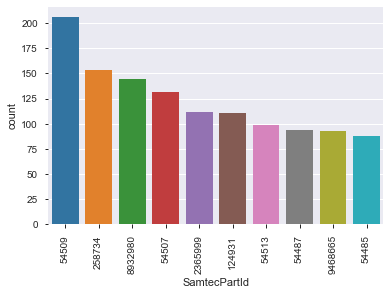

In [21]:
print("Tipo de usuario: 2")
sns.countplot(x = 'SamtecPartId', data = dfCT2, order = dfCT2['SamtecPartId'].value_counts().iloc[:10].index)
plt.xticks(rotation=90)

Tipo de usuario: 3


(array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9]), <a list of 10 Text xticklabel objects>)

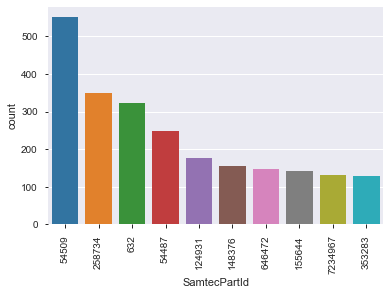

In [22]:
print("Tipo de usuario: 3")
sns.countplot(x = 'SamtecPartId', data = dfCT3, order = dfCT3['SamtecPartId'].value_counts().iloc[:10].index)
plt.xticks(rotation=90)

In [5]:
#Ahora vamos a agrupar las transacciones por OrderId

print(ds.size)
basketCT1 = dfCT1.groupby(['OrderId','SamtecPartId'])["Quantity"].sum().unstack().reset_index().fillna(0).set_index('OrderId')


#print(basketCT1)

# Hay muchos ceros en los datos, pero también debemos asegurarnos de que los valores positivos se conviertan en 1 
# y que todo menos el 0 se establezca en 0. Este paso completará la codificación activa de los datos y eliminará 
# la columna de franqueo (dado que ese cargo no es uno que deseamos explorar):
def encode_units(x):
    if x <= 0:
        return 0
    if x >= 1:
        return 1

basket_sets = basketCT1.applymap(encode_units)

print(basket_sets)
#basket_sets.drop('POSTAGE', inplace=True, axis=1)

1699875
SamtecPartId  9         98        101       103       105       107       \
OrderId                                                                    
3081710              0         0         0         0         0         0   
20042242             0         0         0         0         0         0   
20101228             0         0         0         0         0         0   
20137454             0         0         0         0         0         0   
20146205             0         0         0         0         0         0   
...                ...       ...       ...       ...       ...       ...   
28581936             0         0         0         0         0         0   
28581938             0         0         0         0         0         0   
28581942             0         0         0         0         0         0   
28581945             0         0         0         0         0         0   
28581962             0         0         0         0         0         0   

Sam

In [11]:
# Ahora que los datos están estructurados correctamente, podemos generar conjuntos de elementos frecuentes 
# que tienen un soporte de al menos 0.04% (este número se eligió para poder obtener suficientes ejemplos útiles):

frequent_itemsets = apriori(basket_sets, min_support=0.00042, use_colnames=True)
print(frequent_itemsets)

      support            itemsets
0    0.001092               (632)
1    0.000443             (15334)
2    0.000620             (19345)
3    0.000472             (42222)
4    0.000472             (42698)
..        ...                 ...
234  0.000531          (10023520)
235  0.000472          (10192672)
236  0.000531          (10214098)
237  0.000472    (266138, 284789)
238  0.000915  (9130856, 4298438)

[239 rows x 2 columns]


In [12]:
# El paso final es generar las reglas con su correspondiente apoyo, confianza y elevación:
rules = association_rules(frequent_itemsets, metric="lift")
rules.sort_values('confidence', ascending = False, inplace = True)
print(rules)
rules.to_csv(r'rules.csv')
rules.head(10)

  antecedents consequents  antecedent support  consequent support   support  \
3   (4298438)   (9130856)            0.001505            0.002420  0.000915   
1    (284789)    (266138)            0.000826            0.001417  0.000472   
2   (9130856)   (4298438)            0.002420            0.001505  0.000915   
0    (266138)    (284789)            0.001417            0.000826  0.000472   

   confidence        lift  leverage  conviction  
3    0.607843  251.187470  0.000911    2.543829  
1    0.571429  403.404762  0.000471    2.330028  
2    0.378049  251.187470  0.000911    1.605423  
0    0.333333  403.404762  0.000471    1.498761  


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
3,(4298438),(9130856),0.001505,0.002420,0.000915,0.607843,251.187470,0.000911,2.543829
1,(284789),(266138),0.000826,0.001417,0.000472,0.571429,403.404762,0.000471,2.330028
2,(9130856),(4298438),0.002420,0.001505,0.000915,0.378049,251.187470,0.000911,1.605423
0,(266138),(284789),0.001417,0.000826,0.000472,0.333333,403.404762,0.000471,1.498761


In [13]:
#Probamos ahora los datos para el customerTypeId = 2
basketCT2 = dfCT2.groupby(['OrderId','SamtecPartId'])["Quantity"].sum().unstack().reset_index().fillna(0).set_index('OrderId')



In [14]:
# Hay muchos ceros en los datos, pero también debemos asegurarnos de que los valores positivos se conviertan en 1 
# y que todo menos el 0 se establezca en 0. Este paso completará la codificación activa de los datos y eliminará 
# la columna de franqueo (dado que ese cargo no es uno que deseamos explorar):

basket_sets2 = basketCT2.applymap(encode_units)

print(basket_sets2)

SamtecPartId  8         9         33        38        91        93        \
OrderId                                                                    
21231531             0         0         0         0         0         0   
22987688             0         0         0         0         0         0   
22987729             0         0         0         0         0         0   
22988028             0         0         0         0         0         0   
23011881             0         0         0         0         0         0   
...                ...       ...       ...       ...       ...       ...   
28580688             0         0         0         0         0         0   
28580691             0         0         0         0         0         0   
28580814             0         0         0         0         0         0   
28581881             0         0         0         0         0         0   
28581901             0         0         0         0         0         0   

SamtecPartI

In [22]:
#Ejecutamos algoritmo apriori con un soporte mínimo de 0.06%
# print(basket_sets2.shape)
frequent_itemsets2 = apriori(basket_sets2, min_support=0.0006, use_colnames=True)
print(frequent_itemsets2)

MemoryError: 

In [17]:
# Generamos las reglas con su correspondiente apoyo, confianza y elevación para el customerTypeId = 2:
rules2 = association_rules(frequent_itemsets2, metric="lift")
rules2.sort_values('confidence', ascending = False, inplace = True)
rules2.head(10)

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction


In [3]:
# No aparecen suficientes reglas para CustomerTypeId2, con menos min_support empiezan a dar errores de memoria
#Probamos entonces los datos para el customerTypeId = 3
basketCT3 = dfCT3.groupby(['OrderId','SamtecPartId'])["Quantity"].sum().unstack().reset_index().fillna(0).set_index('OrderId')



In [4]:
def encode_units(x):
    if x <= 0:
        return 0
    if x >= 1:
        return 1

basket_sets3 = basketCT3.applymap(encode_units)

print(basket_sets3)

SamtecPartId  9         36        38        134       173       396       \
OrderId                                                                    
20318378             0         0         0         0         0         0   
20804476             0         0         0         0         0         0   
21413295             0         0         0         0         0         0   
21967926             0         0         0         0         0         0   
22735356             0         0         0         0         0         0   
...                ...       ...       ...       ...       ...       ...   
28581915             0         0         0         0         0         0   
28581918             0         0         0         0         0         0   
28581919             0         0         0         0         0         0   
28581921             0         0         0         0         0         0   
28581939             0         0         0         0         0         0   

SamtecPartI

In [5]:
#Ejecutamos algoritmo apriori con un soporte mínimo de 0.05%
frequent_itemsets3 = apriori(basket_sets3, min_support=0.0006, use_colnames=True)
print(frequent_itemsets3)

      support    itemsets
0    0.002717       (632)
1    0.000625     (16831)
2    0.000640     (40350)
3    0.001280     (53745)
4    0.000859     (54479)
..        ...         ...
167  0.001811   (9844088)
168  0.000734   (9961366)
169  0.000952   (9961372)
170  0.000812   (9961376)
171  0.001046  (10089123)

[172 rows x 2 columns]


In [6]:
rules3 = association_rules(frequent_itemsets3, metric="lift")
rules3.sort_values('confidence', ascending = False, inplace = True)
rules3.head(10)

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
